# Data- Oxford 102 Category Flower Dataset (often just Flowers-102)

**Created by**: Visual Geometry Group (VGG), University of Oxford for Fine-grained image classification

**Classes**: 102 categories of flowers commonly found in the UK.

**Images**: 8,189 total images and  Each class has between 40 and 258 images.
High-quality photographs in varied poses, lighting, and scales

In [ ]:
# Download Oxford Flowers-102 in Colab and visualize ONE example from EACH class (102 classes)

!pip -q install --upgrade torch torchvision

import math, torch
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
# 1) data splits
tfm = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224),
                          transforms.ToTensor(),
                          transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]),])  #Normalization makes your flower images match the “statistical flavor” of ImageNet
root = "/content/data"
train = datasets.Flowers102(root=root, split='train', download=True, transform=tfm)  #Train: 1,020 images (10 per class)
val   = datasets.Flowers102(root=root, split='val',   download=True, transform=tfm)  #Validation: 1,020 images (10 per class)
test  = datasets.Flowers102(root=root, split='test',  download=True, transform=tfm)  #Test: 6,149 images (the remaining images)

train_loader = DataLoader(train, batch_size=32, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val,   batch_size=32, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test,  batch_size=64, shuffle=False, num_workers=2, pin_memory=True)

print(f"Train: {len(train)} | Val: {len(val)} | Test: {len(test)}")


Train: 1020 | Val: 1020 | Test: 6149


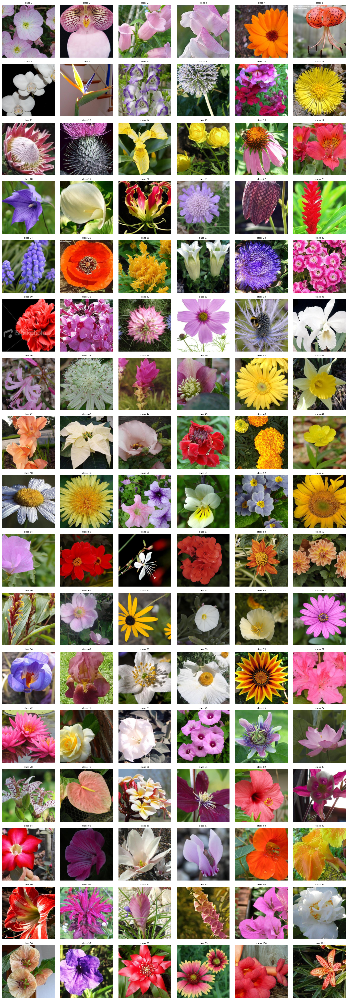

In [ ]:
import matplotlib.pyplot as plt
import math

# 2) Pick the first image for each class across splits
one_per_cls = {}
for ds in [train, val, test]:     # use datasets, not loaders
    for i in range(len(ds)):
        img, y = ds[i]  # y is the class index
        if y not in one_per_cls:
            one_per_cls[y] = img
        if len(one_per_cls) == 102:
            break
    if len(one_per_cls) == 102:
        break

# Try to get human-readable class names (Flowers102 has .categories)
class_names = getattr(train, "categories", None)

# 3) Plot a grid of 102 images (one per class)
N = 102
cols = 6
rows = math.ceil(N / cols)
plt.figure(figsize=(cols*3, rows*3))

for k, cls in enumerate(sorted(one_per_cls.keys())):
    plt.subplot(rows, cols, k+1)
    img = one_per_cls[cls]
    if torch.is_tensor(img):
        img = img.permute(1, 2, 0).numpy()  # CHW → HWC
    plt.imshow(img)
    title = class_names[cls] if class_names else f"class {cls}"
    plt.title(title, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()



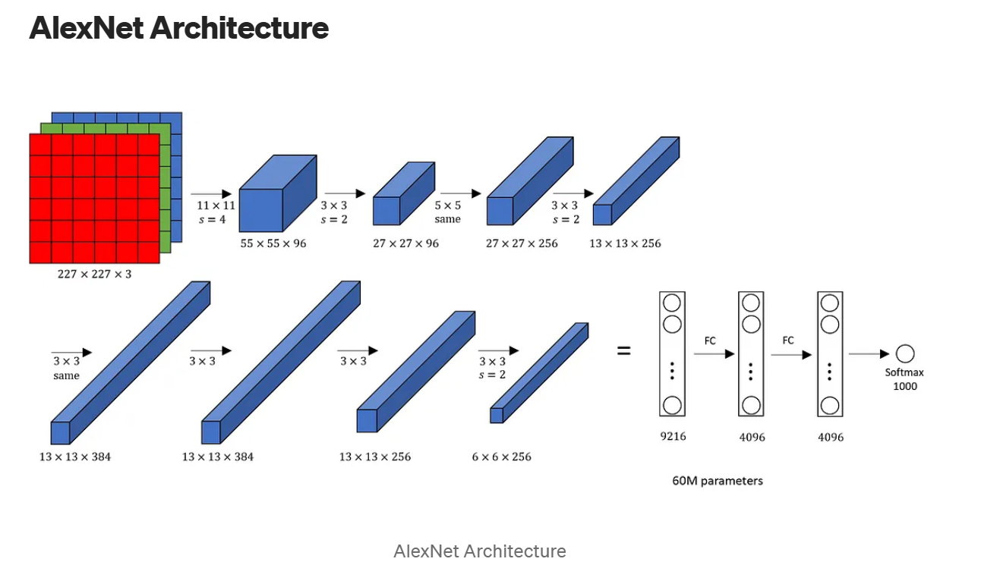

# ALEXNET implementation from scratch

In [ ]:
class AlexNet(nn.Module):
    def __init__(self, num_classes=102):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            # Layer 1
            nn.Conv2d(3, 96, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2), #K MEANS BIAS type of normalization
            nn.MaxPool2d(kernel_size=3, stride=2),

            # Layer 2
            nn.Conv2d(96, 256, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2),
            nn.MaxPool2d(kernel_size=3, stride=2),

            # Layer 3
            nn.Conv2d(256, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            # Layer 4
            nn.Conv2d(384, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            # Layer 5
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=0.5),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# Instantiate the model
model = AlexNet(num_classes=102)
model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
import time
# Make a dict of dataloaders
dataloaders = {
    'train': train_loader,
    'val': val_loader
}

# Store dataset sizes (needed for epoch loss/acc)
dataset_sizes = {
    'train': len(train),
    'val': len(val)
}

def train_model(model, criterion, optimizer, num_epochs=25):
    since = time.time()
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # Backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc*100 :.4f}')

            # Deep copy the model if it's the best validation accuracy
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc*100


        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    #print(f'Best val Acc: {best_acc:.4f}')

# Start training
train_model(model, criterion, optimizer, num_epochs=20)

Epoch 0/19
----------
train Loss: 3.8367 Acc: 3.8235
val Loss: 4.0035 Acc: 5.2941

Epoch 1/19
----------
train Loss: 3.7738 Acc: 5.6863
val Loss: 3.8824 Acc: 7.2549

Epoch 2/19
----------
train Loss: 3.6397 Acc: 8.0392
val Loss: 3.7289 Acc: 8.6275

Epoch 3/19
----------
train Loss: 3.5811 Acc: 6.8627
val Loss: 3.7682 Acc: 7.9412

Epoch 4/19
----------
train Loss: 3.4791 Acc: 9.1176
val Loss: 3.7079 Acc: 9.0196

Epoch 5/19
----------
train Loss: 3.3694 Acc: 11.2745
val Loss: 3.6143 Acc: 9.9020

Epoch 6/19
----------
train Loss: 3.2916 Acc: 13.2353
val Loss: 3.7007 Acc: 10.7843

Epoch 7/19
----------
train Loss: 3.2127 Acc: 13.7255
val Loss: 3.6396 Acc: 10.4902

Epoch 8/19
----------
train Loss: 3.1565 Acc: 16.4706
val Loss: 3.7740 Acc: 12.9412

Epoch 9/19
----------
train Loss: 2.9887 Acc: 18.0392
val Loss: 3.6696 Acc: 13.7255

Epoch 10/19
----------
train Loss: 2.9221 Acc: 20.9804
val Loss: 3.8897 Acc: 13.6275

Epoch 11/19
----------
train Loss: 2.7447 Acc: 24.0196
val Loss: 3.8069 Acc

# ALEXNET PRETRAINED MODEL

In [ ]:
!pip install torchsummary


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchsummary import summary

# Load pretrained AlexNet
alexnet = models.alexnet(pretrained=True)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

# Print summary (for input image size 3x224x224 as in ImageNet)
summary(alexnet, (3, 224, 224))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
print(alexnet)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

# ----- Build model -----
alexnet = models.alexnet(pretrained=True)
alexnet.classifier[6] = nn.Linear(alexnet.classifier[6].in_features, 102)

'''
# make a new classifier with extra layer
alexnet.classifier = nn.Sequential(
    *list(alexnet.classifier[:-1]),  # keep everything except old final layer
    nn.Linear(in_features, 102),     # new final layer (e.g. Flowers-102)
    nn.ReLU(inplace=True),           # <-- extra layer
    nn.Linear(102, 10)               # new "head" after that
)
'''

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
alexnet = alexnet.to(device)

In [ ]:

FEATURES_TO_TRAIN   = [8, 10]      # e.g., last two conv layers; or [] for none
CLASSIFIER_TO_TRAIN = [4, 6]       # e.g., last two FCs; always include 6

# ----- Freeze everything -----
for p in alexnet.parameters():
    p.requires_grad = False

# ----- Unfreeze chosen feature layers -----
for i in FEATURES_TO_TRAIN:
    if 0 <= i < len(alexnet.features):
        for p in alexnet.features[i].parameters():
            p.requires_grad = True

# ----- Unfreeze chosen classifier layers  -----
if 6 not in CLASSIFIER_TO_TRAIN:
    CLASSIFIER_TO_TRAIN.append(6)
for i in CLASSIFIER_TO_TRAIN:
    if 0 <= i < len(alexnet.classifier):
        for p in alexnet.classifier[i].parameters():
            p.requires_grad = True

In [ ]:

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam((p for p in alexnet.parameters() if p.requires_grad), lr=1e-3)

# ===== Training
def accuracy(logits, y):
    return (logits.argmax(dim=1) == y).float().mean().item()

@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    tot_loss, tot_acc, n = 0.0, 0.0, 0
    for x, y in loader:
        x, y = x.to(device), y.to(device)
        out = model(x)
        loss = criterion(out, y)
        b = y.size(0)
        tot_loss += loss.item() * b
        tot_acc  += accuracy(out, y) * b
        n += b
    return tot_loss / n, tot_acc / n

def train_one_epoch(model, loader, optimizer):
    model.train()
    tot_loss, tot_acc, n = 0.0, 0.0, 0
    for x, y in loader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad(set_to_none=True)
        out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        b = y.size(0)
        tot_loss += loss.item() * b
        tot_acc  += accuracy(out, y) * b
        n += b
    return tot_loss / n, tot_acc / n

In [ ]:
# ----- Train a few epochs -----
best = 0.0
for epoch in range(1, 11):
    tr_loss, tr_acc = train_one_epoch(alexnet, train_loader, optimizer)
    va_loss, va_acc = evaluate(alexnet, val_loader)
    print(f"Epoch {epoch:02d} | train {tr_loss:.4f}/{tr_acc*100:.4f} | val {va_loss:.4f}/{va_acc*100:.4f}")
    if va_acc > best:
        best = va_acc
        torch.save(alexnet.state_dict(), "/content/alexnet_flowers102_simple.pt")
        print("  ✅ saved best")

Epoch 01 | train 2.7253/56.3725 | val 2.9401/42.1569
  ✅ saved best
Epoch 02 | train 1.1205/72.7451 | val 1.8954/58.8235
  ✅ saved best
Epoch 03 | train 0.4376/89.0196 | val 2.1521/60.0980
  ✅ saved best
Epoch 04 | train 0.4891/88.5294 | val 2.3731/60.4902
  ✅ saved best
Epoch 05 | train 0.3854/90.8824 | val 2.0138/65.7843
  ✅ saved best
Epoch 06 | train 0.3724/91.2745 | val 2.0403/60.0000
Epoch 07 | train 0.2567/93.3333 | val 2.2373/63.0392
Epoch 08 | train 0.1928/94.5098 | val 2.0464/63.8235
Epoch 09 | train 0.2512/94.4118 | val 2.2544/65.8824
  ✅ saved best
Epoch 10 | train 0.2562/95.3922 | val 2.6480/63.5294


WITHOUT NORMALIZATION ACCURACY


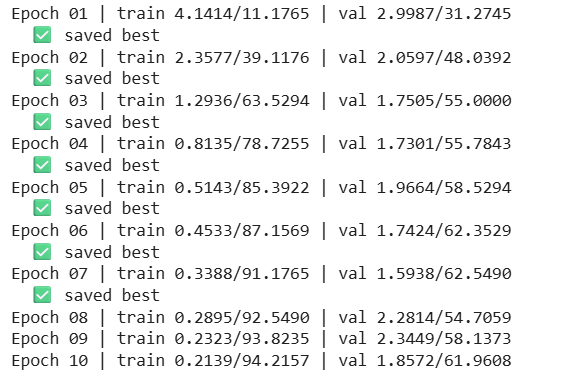

In [ ]:
# ----- Test -----
alexnet.load_state_dict(torch.load("/content/alexnet_flowers102_simple.pt", map_location=device))
test_loader = DataLoader(test, batch_size=64, shuffle=False)
test_loss, test_acc = evaluate(alexnet, test_loader)
print(f"Test loss {test_loss:.4f} | Test acc {test_acc*100:.4f}")


Test loss 2.5740 | Test acc 63.6526


# RESNET PRETRAINED MODEL
in practice, when networks got too deep (e.g., >20–30 layers):Training became very hard.Accuracy saturated (degradation problem).Why? Because of:Vanishing/exploding gradients (hard for signals to flow through many layers).Optimization difficulty

so Resnet help in easier optimization: Skip connections act like "shortcuts" for gradient flow.

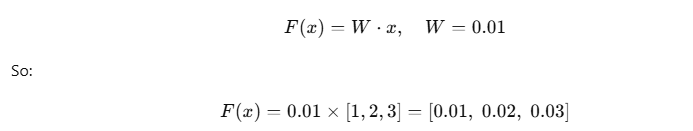

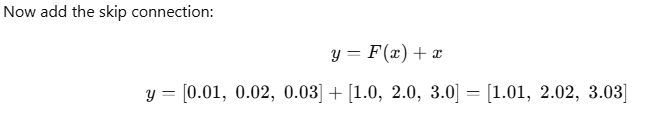



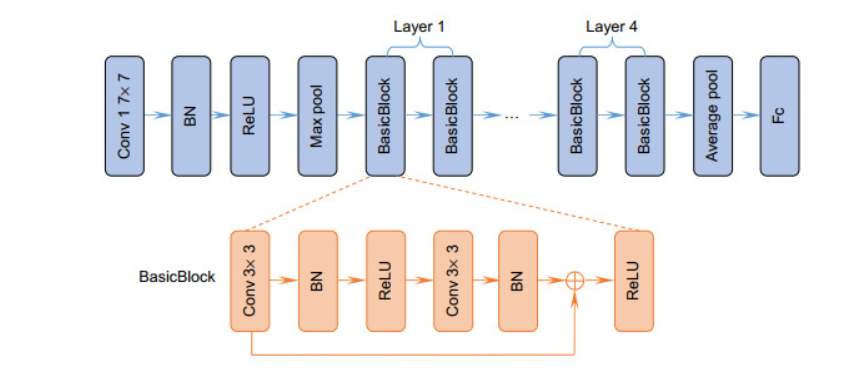

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchsummary import summary

# Load pretrained ResNet-18
# (For older torchvision versions, pretrained=True works; otherwise use weights=...)
'''
try:
    resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
except Exception:
    resnet = models.resnet18(pretrained=True)
    '''
resnet = models.resnet18(pretrained=True)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet = resnet.to(device)

# Print summary (for input image size 3x224x224 as in ImageNet)
summary(resnet, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [ ]:
print(resnet)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# CHOOSE WHAT TO TRAIN
# Options: "conv1", "bn1", "layer1", "layer2", "layer3", "layer4", "fc"
PARTS_TO_TRAIN = ["layer4", "fc"]

# Freeze everything
for p in resnet.parameters():
    p.requires_grad = False

# Unfreeze chosen parts
def unfreeze(module):
    for p in module.parameters():
        p.requires_grad = True

name2mod = {
    "conv1":  resnet.conv1,
    "bn1":    resnet.bn1,
    "layer1": resnet.layer1,
    "layer2": resnet.layer2,
    "layer3": resnet.layer3,
    "layer4": resnet.layer4,
    "fc":     resnet.fc,
}
for name in PARTS_TO_TRAIN:
    if name in name2mod:
        unfreeze(name2mod[name])


In [ ]:
# Loss & Optimizer -
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam((p for p in resnet.parameters() if p.requires_grad), lr=1e-3)

# Training / Validation
def accuracy(logits, y):
    return (logits.argmax(dim=1) == y).float().mean().item()

def train_one_epoch(model, loader, optimizer):
    model.train()
    tot_loss, tot_acc, n = 0.0, 0.0, 0
    for x, y in loader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad(set_to_none=True)
        out = model(x)
        loss = criterion(out, y)
        loss.backward()
        optimizer.step()
        b = y.size(0)
        tot_loss += loss.item() * b
        tot_acc  += accuracy(out, y) * b
        n += b
    return tot_loss / n, tot_acc / n

@torch.no_grad() #dont caluclate any gradient
def evaluate(model, loader):
    model.eval()
    tot_loss, tot_acc, n = 0.0, 0.0, 0
    for x, y in loader:
        x, y = x.to(device), y.to(device)
        out = model(x)
        loss = criterion(out, y)
        b = y.size(0)
        tot_loss += loss.item() * b
        tot_acc  += accuracy(out, y) * b
        n += b
    return tot_loss / n, tot_acc / n




In [ ]:

best = 0.0
ckpt_path = "/content/resnet18_flowers102_simple.pt"

for epoch in range(1, 11):
    tr_loss, tr_acc = train_one_epoch(resnet, train_loader, optimizer)
    va_loss, va_acc = evaluate(resnet, val_loader)
    print(f"Epoch {epoch:02d} | train {tr_loss:.4f}/{tr_acc*100:.4f} | val {va_loss:.4f}/{va_acc*100:.4f}")
    if va_acc > best:
        best = va_acc
        torch.save(resnet.state_dict(), ckpt_path)
        print("  ✅ saved best")



Epoch 01 | train 2.9761/37.9412 | val 1.2313/67.3529
  ✅ saved best
Epoch 02 | train 0.4618/95.5882 | val 0.7606/87.6471
  ✅ saved best
Epoch 03 | train 0.0719/99.6078 | val 0.5938/88.2353
  ✅ saved best
Epoch 04 | train 0.0210/100.0000 | val 0.4961/90.9804
  ✅ saved best
Epoch 05 | train 0.0088/100.0000 | val 0.4584/91.4706
  ✅ saved best
Epoch 06 | train 0.0057/100.0000 | val 0.4434/91.4706
Epoch 07 | train 0.0043/100.0000 | val 0.4309/91.9608
  ✅ saved best
Epoch 08 | train 0.0038/100.0000 | val 0.4215/92.1569
  ✅ saved best
Epoch 09 | train 0.0031/100.0000 | val 0.4237/92.0588
Epoch 10 | train 0.0028/100.0000 | val 0.4085/92.0588


In [ ]:
# ----- Test -----
resnet.load_state_dict(torch.load(ckpt_path, map_location=device))
test_loss, test_acc = evaluate(resnet, test_loader)
print(f"Test loss {test_loss:.4f} | Test acc {test_acc*100:.4f}")


Test loss 0.4990 | Test acc 89.6243


# BATCH NORMALIZATION AND DROPOUT
**Batch Normalization (BN)**:
Deep networks suffer from something called internal covariate shift → as training progresses, the distribution of inputs to each layer keeps changing (because earlier layers update their weights).
This slows training and makes it harder to tune learning rates.
what BN does
BN normalizes the inputs to each layer so they have zero mean and unit variance (like standardization), but it does this for each mini-batch during training.
After normalization, BN applies two learnable parameters (γ and β) to scale and shift the values back if needed. So BN normalizes per channel across batch + spatial dimensions.It does not mix channels.

**Dropout**:
torch.nn.Dropout(p=0.5)
p = probability of dropping a neuron (default = 0.5).
During training: randomly zeroes neurons with probability p.
During evaluation (model.eval()): dropout is disabled (all neurons active).
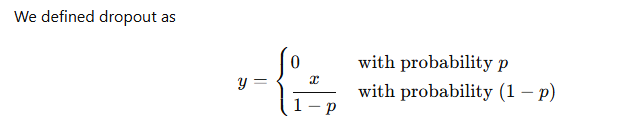
we scale them first by dividing all neuron by (1-p) then multiply each neuron with 0 or 1-p, also internally it works out like this (0*x)/(1-p) and  (1*x)/(1-p) 0 and 1 overhere repesent the masking and divinding by 1-p here represent scaling, this makes the surviving neuron’s value larger (compensates for dropped neurons).

Dropout gives each neuron an independent probability p of being dropped. In small examples it looks random (sometimes all neurons vanish!), but in real networks with thousands of neurons, the proportion of dropped neurons will be very close to p. This is why dropout is reliable — it randomly turns off a fraction of neurons each forward pass, forcing the network to not rely on any single neuron

In [ ]:
#CIFAR-10
import torch, torch.nn as nn, torch.nn.functional as F, torch.optim as optim
from torch.utils.data import DataLoader, random_split
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np, random, time


seed = 42
random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)

# Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.backends.cudnn.benchmark = True
use_amp = torch.cuda.is_available()
from torch.amp import autocast, GradScaler
scaler = GradScaler('cuda', enabled=use_amp)

# Data
MEAN, STD = (0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616)
transform_train = T.Compose([T.ToTensor(), T.Normalize(MEAN, STD)])
transform_test  = T.Compose([T.ToTensor(), T.Normalize(MEAN, STD)])

root = './data'
full_train = torchvision.datasets.CIFAR10(root=root, train=True,  download=True, transform=transform_train)
test_set   = torchvision.datasets.CIFAR10(root=root, train=False, download=True, transform=transform_test)

# 45k train / 5k val split
val_size = 5000
train_size = len(full_train) - val_size
train_set, val_set = random_split(full_train, [train_size, val_size], generator=torch.Generator().manual_seed(seed))

train_loader = DataLoader(train_set, batch_size=128, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_set,   batch_size=256, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_set,  batch_size=256, shuffle=False, num_workers=2, pin_memory=True)

print(f"Train: {len(train_set)} | Val: {len(val_set)} | Test: {len(test_set)}")


Train: 45000 | Val: 5000 | Test: 10000


In [ ]:
#Architecture: without BN and Dropout

class DeepCNN_NoReg(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, 3, padding=1, bias=True),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)  # 32->16
        )
        self.block2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1, bias=True),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)  # 16->8
        )
        self.block3 = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1, bias=True),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)  # 8->4
        )
        self.classifier = nn.Sequential(
            nn.Linear(256*4*4, 1024), nn.ReLU(inplace=True),
            nn.Linear(1024, 512),    nn.ReLU(inplace=True),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.block1(x); x = self.block2(x); x = self.block3(x)
        x = x.view(x.size(0), -1)
        return self.classifier(x)


In [ ]:
#Architecture: BN and Dropout

class DeepCNN_BNDrop(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1, bias=False),
            nn.BatchNorm2d(64), nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, 3, padding=1, bias=False),
            nn.BatchNorm2d(64), nn.ReLU(inplace=True),
            nn.Dropout2d(0.10),
            nn.MaxPool2d(2)
        )
        self.block2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1, bias=False),
            nn.BatchNorm2d(128), nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, 3, padding=1, bias=False),
            nn.BatchNorm2d(128), nn.ReLU(inplace=True),
            nn.Dropout2d(0.10),
            nn.MaxPool2d(2)
        )
        self.block3 = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256), nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256), nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, 3, padding=1, bias=False),
            nn.BatchNorm2d(256), nn.ReLU(inplace=True),
            nn.Dropout2d(0.10),
            nn.MaxPool2d(2)
        )
        self.classifier = nn.Sequential(
            nn.Linear(256*4*4, 1024, bias=False),
            nn.BatchNorm1d(1024), nn.ReLU(inplace=True), nn.Dropout(0.5),
            nn.Linear(1024, 512, bias=False),
            nn.BatchNorm1d(512),  nn.ReLU(inplace=True), nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.block1(x); x = self.block2(x); x = self.block3(x)
        x = x.view(x.size(0), -1)
        return self.classifier(x)

In [ ]:
# Training and evaluation
def run_epoch(model, loader, optimizer=None):
    train = optimizer is not None
    model.train() if train else model.eval()
    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            if train:
                optimizer.zero_grad(set_to_none=True)
                with autocast('cuda', dtype=torch.float16, enabled=use_amp):
                    outputs = model(imgs)
                    loss = criterion(outputs, labels)
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                outputs = model(imgs)
                loss = criterion(outputs, labels)
            total_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)
    return total_loss/len(loader), 100.0*correct/total

def train_model(model, name, epochs=40, lr=1e-3, weight_decay=0.0):
    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    history = {'train_loss':[], 'train_acc':[], 'val_loss':[], 'val_acc':[]}
    t0 = time.time()
    for ep in range(1, epochs+1):
        tr_loss, tr_acc = run_epoch(model, train_loader, optimizer)
        va_loss, va_acc = run_epoch(model, val_loader,   optimizer=None)
        history['train_loss'].append(tr_loss); history['train_acc'].append(tr_acc)
        history['val_loss'].append(va_loss);   history['val_acc'].append(va_acc)
        print(f"[{name}] Epoch {ep:02d}/{epochs} | "
              f"Train {tr_loss:.4f}/{tr_acc:.2f}% | Val {va_loss:.4f}/{va_acc:.2f}%")
    dt = time.time()-t0
    print(f"[{name}] Done in {dt//60:.0f}m {dt%60:.0f}s")
    # Test
    test_loss, test_acc = run_epoch(model, test_loader, optimizer=None)
    print(f"[{name}] Test Loss {test_loss:.4f} | Test Acc {test_acc:.2f}%")
    return model, history, (test_loss, test_acc)

criterion = nn.CrossEntropyLoss()

In [ ]:
#model(without BN and Dropout)
model_noreg = DeepCNN_NoReg()
model_noreg, hist_noreg, test_noreg = train_model(
    model_noreg, name="NoReg", epochs=40, lr=1e-3, weight_decay=0.0
)

[NoReg] Epoch 01/40 | Train 1.6814/35.79% | Val 1.2774/52.68%
[NoReg] Epoch 02/40 | Train 1.1679/57.95% | Val 0.9963/63.90%
[NoReg] Epoch 03/40 | Train 0.8928/67.93% | Val 0.8319/70.12%
[NoReg] Epoch 04/40 | Train 0.7264/74.34% | Val 0.7318/74.08%
[NoReg] Epoch 05/40 | Train 0.6069/78.72% | Val 0.6923/75.32%
[NoReg] Epoch 06/40 | Train 0.5028/82.33% | Val 0.6910/76.32%
[NoReg] Epoch 07/40 | Train 0.4235/85.06% | Val 0.7073/77.40%
[NoReg] Epoch 08/40 | Train 0.3378/88.11% | Val 0.6751/78.44%
[NoReg] Epoch 09/40 | Train 0.2692/90.52% | Val 0.7708/77.86%
[NoReg] Epoch 10/40 | Train 0.2249/91.92% | Val 0.8218/77.72%
[NoReg] Epoch 11/40 | Train 0.1909/93.36% | Val 0.8395/78.70%
[NoReg] Epoch 12/40 | Train 0.1652/94.36% | Val 0.8907/77.92%
[NoReg] Epoch 13/40 | Train 0.1450/94.95% | Val 0.9761/78.04%
[NoReg] Epoch 14/40 | Train 0.1159/96.08% | Val 1.0188/77.84%
[NoReg] Epoch 15/40 | Train 0.1134/96.16% | Val 1.0272/77.70%
[NoReg] Epoch 16/40 | Train 0.1065/96.40% | Val 1.0449/78.02%
[NoReg] 

In [ ]:
#model(without BN and Dropout)
# With BN+Dropout: expect better generalization
model_reg = DeepCNN_BNDrop()
model_reg, hist_reg, test_reg = train_model(
    model_reg, name="BN+Drop", epochs=40, lr=1e-3, weight_decay=5e-4
)

[BN+Drop] Epoch 01/40 | Train 1.3312/51.92% | Val 1.1426/60.68%
[BN+Drop] Epoch 02/40 | Train 0.8900/68.94% | Val 0.7626/72.56%
[BN+Drop] Epoch 03/40 | Train 0.7387/74.64% | Val 0.6987/75.32%
[BN+Drop] Epoch 04/40 | Train 0.6534/78.06% | Val 0.6573/76.60%
[BN+Drop] Epoch 05/40 | Train 0.5960/79.90% | Val 0.5541/80.90%
[BN+Drop] Epoch 06/40 | Train 0.5471/81.57% | Val 0.5308/81.34%
[BN+Drop] Epoch 07/40 | Train 0.5040/83.04% | Val 0.5347/81.72%
[BN+Drop] Epoch 08/40 | Train 0.4742/83.89% | Val 0.5084/82.16%
[BN+Drop] Epoch 09/40 | Train 0.4400/85.35% | Val 0.4891/83.22%
[BN+Drop] Epoch 10/40 | Train 0.4139/86.16% | Val 0.5499/81.44%
[BN+Drop] Epoch 11/40 | Train 0.3923/86.87% | Val 0.4982/83.20%
[BN+Drop] Epoch 12/40 | Train 0.3660/87.82% | Val 0.4719/84.00%
[BN+Drop] Epoch 13/40 | Train 0.3445/88.53% | Val 0.4405/85.58%
[BN+Drop] Epoch 14/40 | Train 0.3304/88.95% | Val 0.4379/85.00%
[BN+Drop] Epoch 15/40 | Train 0.3085/89.80% | Val 0.5279/82.52%
[BN+Drop] Epoch 16/40 | Train 0.2959/90.

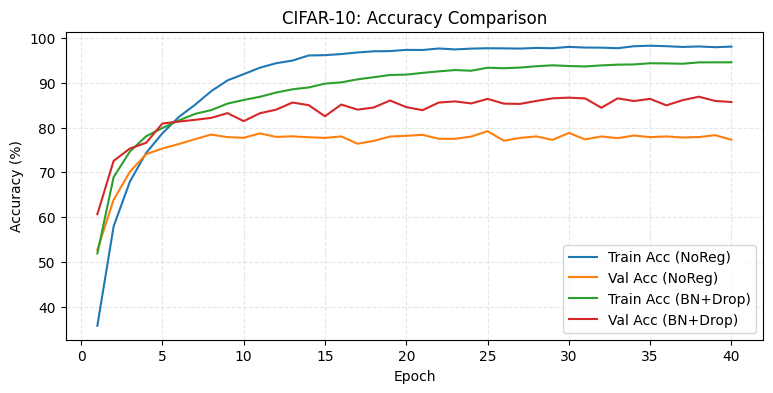

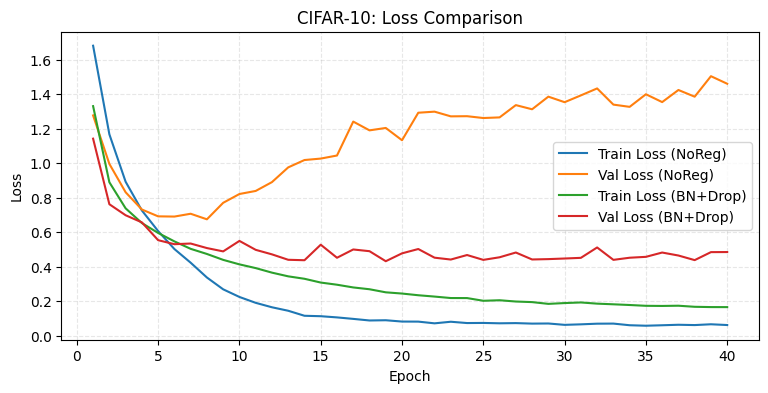

NoReg   Test Acc: 77.32%
BN+Drop Test Acc: 85.80%


In [ ]:
# plots
epochs_range = range(1, len(hist_noreg['train_acc'])+1)

plt.figure(figsize=(9,4))
plt.plot(epochs_range, hist_noreg['train_acc'], label="Train Acc (NoReg)")
plt.plot(epochs_range, hist_noreg['val_acc'],   label="Val Acc (NoReg)")
plt.plot(epochs_range, hist_reg['train_acc'],   label="Train Acc (BN+Drop)")
plt.plot(epochs_range, hist_reg['val_acc'],     label="Val Acc (BN+Drop)")
plt.xlabel("Epoch"); plt.ylabel("Accuracy (%)"); plt.title("CIFAR-10: Accuracy Comparison")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.3); plt.show()

plt.figure(figsize=(9,4))
plt.plot(epochs_range, hist_noreg['train_loss'], label="Train Loss (NoReg)")
plt.plot(epochs_range, hist_noreg['val_loss'],   label="Val Loss (NoReg)")
plt.plot(epochs_range, hist_reg['train_loss'],   label="Train Loss (BN+Drop)")
plt.plot(epochs_range, hist_reg['val_loss'],     label="Val Loss (BN+Drop)")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title("CIFAR-10: Loss Comparison")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.3); plt.show()

print(f"NoReg   Test Acc: {test_noreg[1]:.2f}%")
print(f"BN+Drop Test Acc: {test_reg[1]:.2f}%")